In [2]:
library(Seurat)

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject



In [3]:
folder_path <- "/data2/ZenNa/DFU_Project/Data/SubSet_DFU-Healer_DFU-Non healer"
csv_files <- list.files(path = folder_path, pattern = "\\.csv$", full.names = TRUE)

In [4]:
# Init seurat object list
seurat_object_list <- list()

In [5]:
for (csv_file in csv_files) {
  # Read the CSV file into a data frame
  dataset <- read.csv(csv_file)
  
  # Extract the sample name from the file name
  sample_name <- tools::file_path_sans_ext(basename(csv_file))
  
  # Create a Seurat object from the data frame
  seurat_obj <- CreateSeuratObject(counts = dataset, project = sample_name, min.cells = 3, min.features = 200)
  
  # Subset the Seurat object based on specific criteria
   seurat_obj[["percent.mt"]] <- PercentageFeatureSet(seurat_obj, pattern = "^MT-")

  seurat_obj <- subset(seurat_obj, subset = nFeature_RNA > 200 & nFeature_RNA < 2500 & percent.mt < 50)
  
  # Store the Seurat object in the list using the sample name as the key
  seurat_object_list[[sample_name]] <- seurat_obj
}

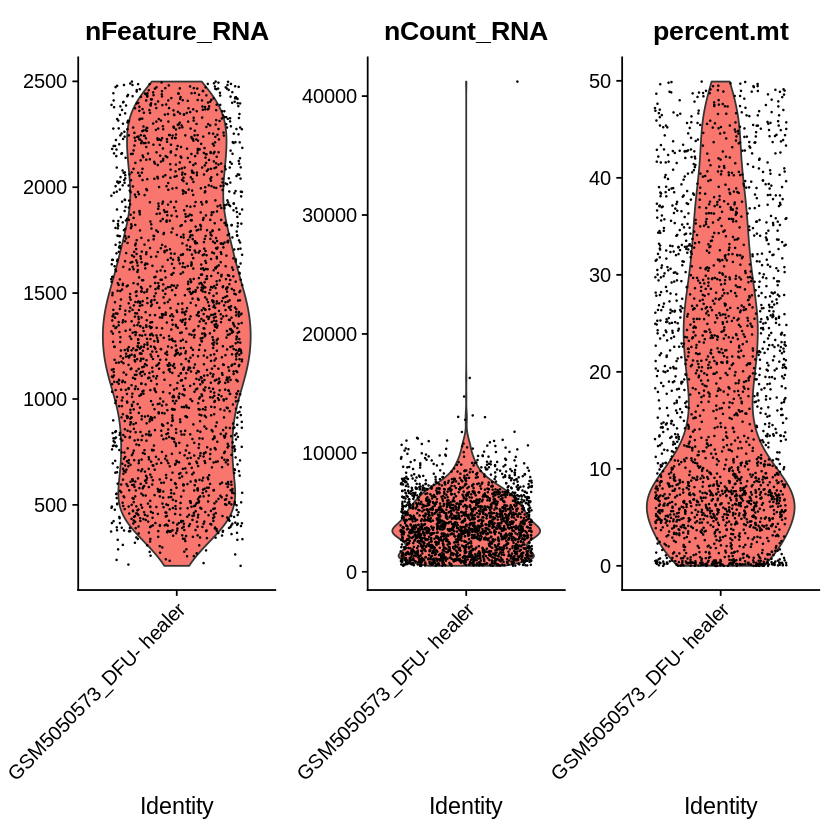

In [6]:
VlnPlot(seurat_obj, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)


In [7]:
DFU_data.list <- seurat_object_list

In [8]:
DFU_data.list <- lapply(X = DFU_data.list, FUN = function(x) {
    x <- NormalizeData(x, verbose = FALSE)
    x <- FindVariableFeatures(x, verbose = FALSE)
})

In [106]:
save(DFU_data.list, file = "DFU_data.list.RData")


# Next, select features for downstream integration, and run PCA on each object in the list, which is required for running the alternative reciprocal PCA workflow.

In [9]:
features <- SelectIntegrationFeatures(object.list = DFU_data.list)
DFU_data.list <- lapply(X = DFU_data.list, FUN = function(x) {
    x <- ScaleData(x, features = features, verbose = FALSE)
    x <- RunPCA(x, features = features, verbose = FALSE)
})

In [10]:
anchors <- FindIntegrationAnchors(object.list = DFU_data.list, reference = c(1, 2), reduction = "rpca",
    dims = 1:50)
DFU_data.integrated <- IntegrateData(anchorset = anchors, dims = 1:50)

Warning message in CheckDuplicateCellNames(object.list = object.list):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Computing 2000 integration features

Scaling features for provided objects

Computing within dataset neighborhoods

Finding anchors between all query and reference datasets

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1657 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1488 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1317 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1343 anchors

Projecting new data onto SVD

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 1327 anchors

Projecting new data onto SVD

Projecting new data ont

In [11]:
DFU_data.integrated <- ScaleData(DFU_data.integrated, verbose = FALSE)
DFU_data.integrated <- RunPCA(DFU_data.integrated, verbose = FALSE)
DFU_data.integrated <- RunUMAP(DFU_data.integrated, dims = 1:50)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
19:37:13 UMAP embedding parameters a = 0.9922 b = 1.112

19:37:13 Read 29319 rows and found 50 numeric columns

19:37:13 Using Annoy for neighbor search, n_neighbors = 30

19:37:13 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

19:37:16 Writing NN index file to temp file /tmp/RtmpMnH2Sm/file8bb25f6c81b4

19:37:16 Searching Annoy index using 1 thread, search_k = 3000

19:37:24 Annoy recall = 100%

19:37:24 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors 

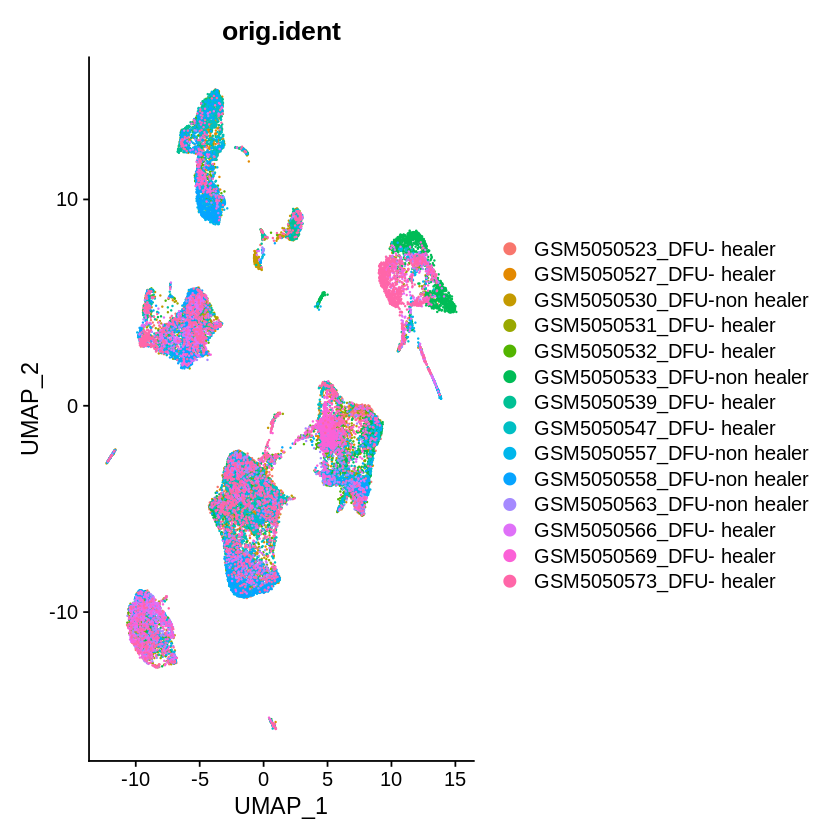

In [12]:
DimPlot(DFU_data.integrated, group.by = "orig.ident")

In [13]:
# Split groups

In [14]:
# Create a new metadata column to group samples
DFU_data.integrated$major_group <- ifelse(grepl("_DFU-non healer$", DFU_data.integrated$orig.ident), "DFU-non healer", "DFU- healer")

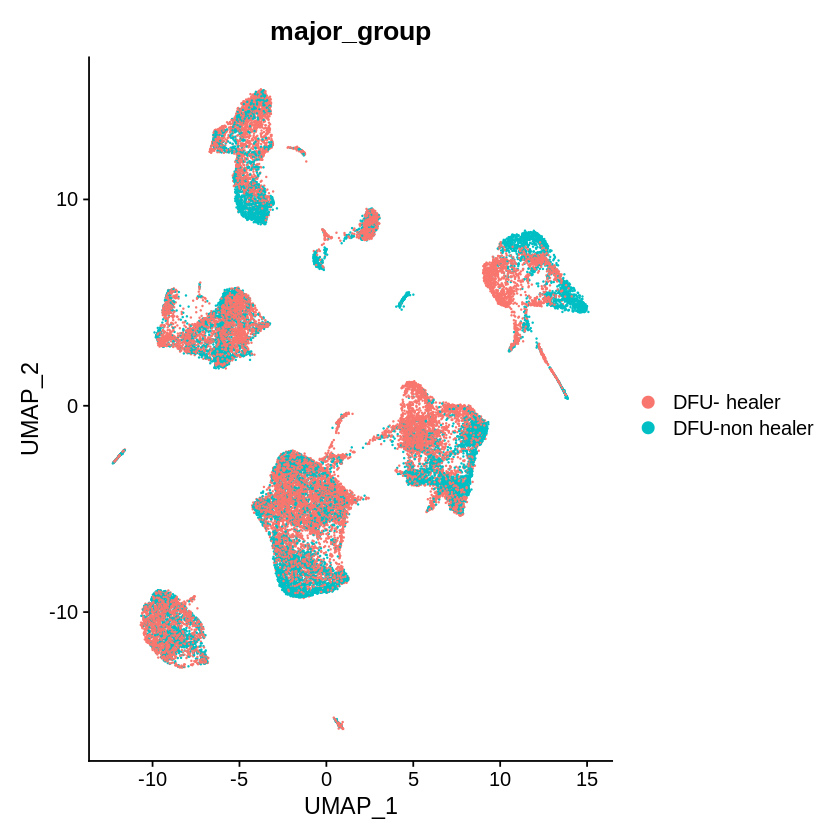

In [15]:
# Plot based on the major_group column
DimPlot(DFU_data.integrated, group.by = "major_group")

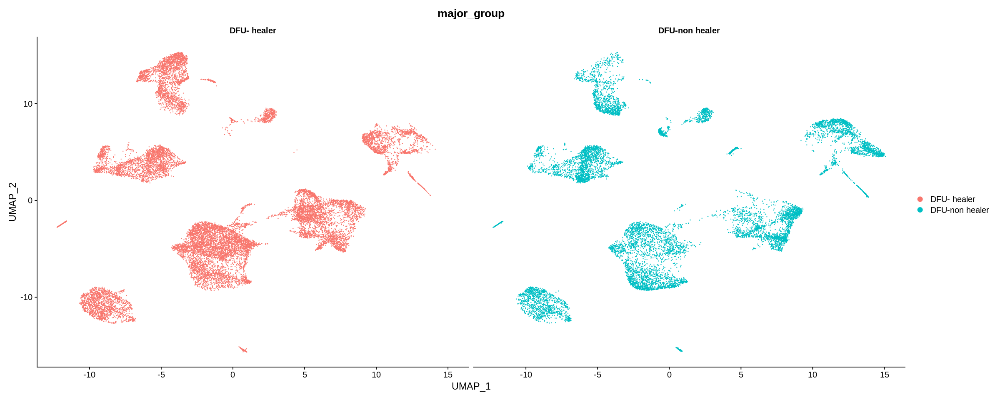

In [16]:
# Set the size of the UMAP plots
options(repr.plot.width = 20, repr.plot.height = 8)
# Create separate UMAP plots for each major group
DimPlot(DFU_data.integrated, group.by = "major_group", split.by = "major_group")

In [17]:
DFU_data.integrated <- FindNeighbors(DFU_data.integrated, dims = 1:50)


Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 29319
Number of edges: 1167587

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9935
Number of communities: 9
Elapsed time: 5 seconds


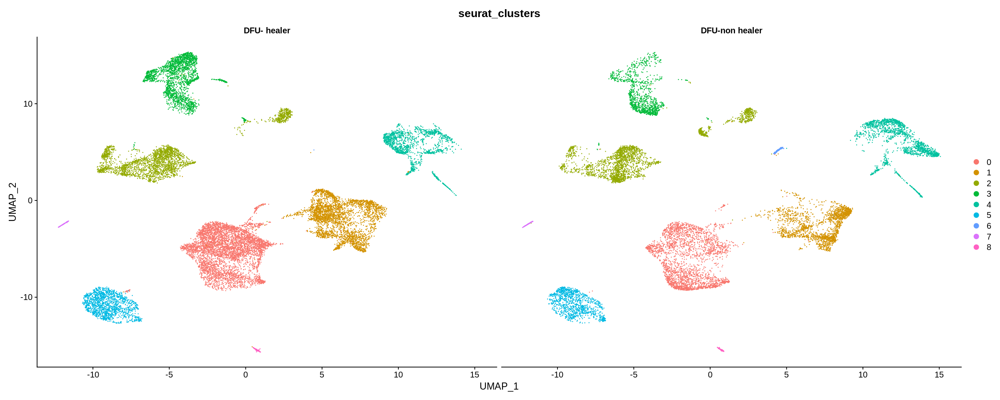

In [18]:
options(repr.plot.width = 20, repr.plot.height = 8)
DFU_data.integrated <- FindClusters(DFU_data.integrated, resolution = 0.02)  # can adjust the resolution parameter
DimPlot(DFU_data.integrated, group.by = 'seurat_clusters', split.by = "major_group")

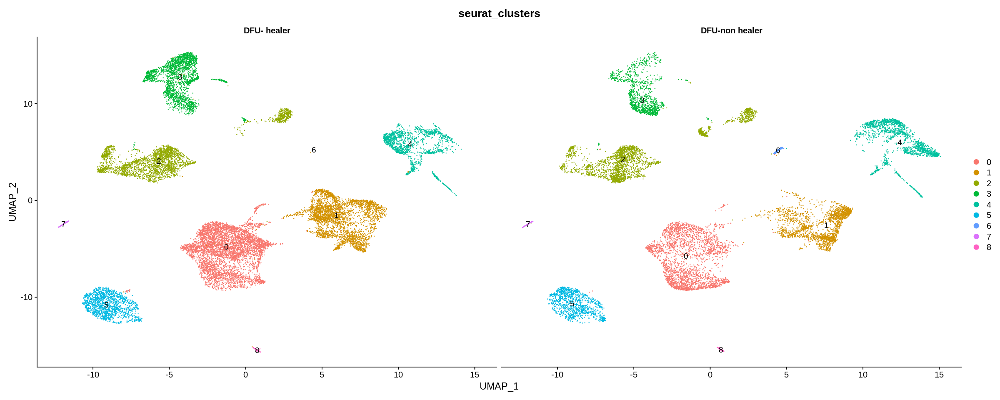

In [19]:
DimPlot(DFU_data.integrated, 
        group.by = 'seurat_clusters', 
        split.by = "major_group", 
        label = TRUE) # Add labels to clusters

In [20]:
install.packages('BiocManager')
BiocManager::install('limma')

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

'getOption("repos")' replaces Bioconductor standard repositories, see
'help("repositories", package = "BiocManager")' for details.
Replacement repositories:
    CRAN: https://cran.r-project.org

Bioconductor version 3.16 (BiocManager 1.30.22), R 4.2.3 (2023-03-15)

Warning message:
“package(s) not installed when version(s) same as or greater than current; use
  `force = TRUE` to re-install: 'limma'”
Old packages: 'harmony', 'knitr', 'Matrix', 'RcppArmadillo', 'reticulate',
  'rmarkdown', 'sctransform', 'spatstat.random'



In [21]:
library(limma)

In [22]:
cluster.markers <- FindAllMarkers(obj=DFU_data.integrated,
                                only.pos=FALSE,
                                min.pct=0.25,
                                logfc.thrshold=logFCfilter)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8



Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: CD206”


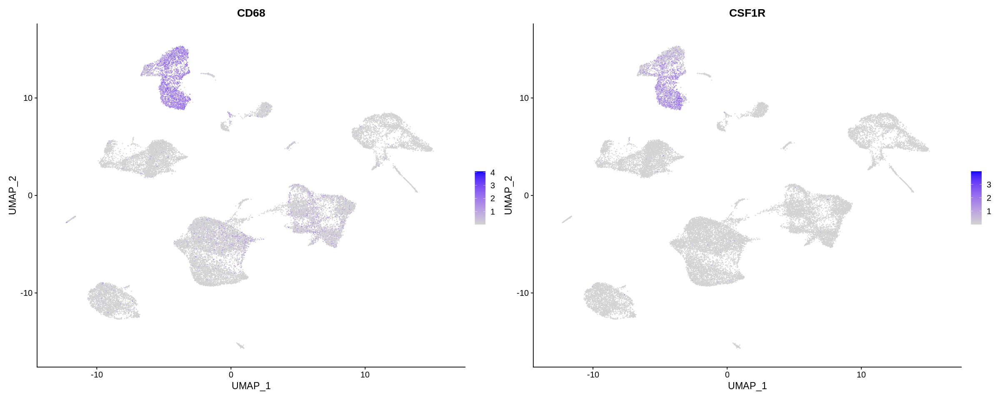

In [23]:
FeaturePlot(DFU_data.integrated, features = c('CD68', 'CSF1R', 'CD206'), min.cutoff = "q9") #macrophage 3

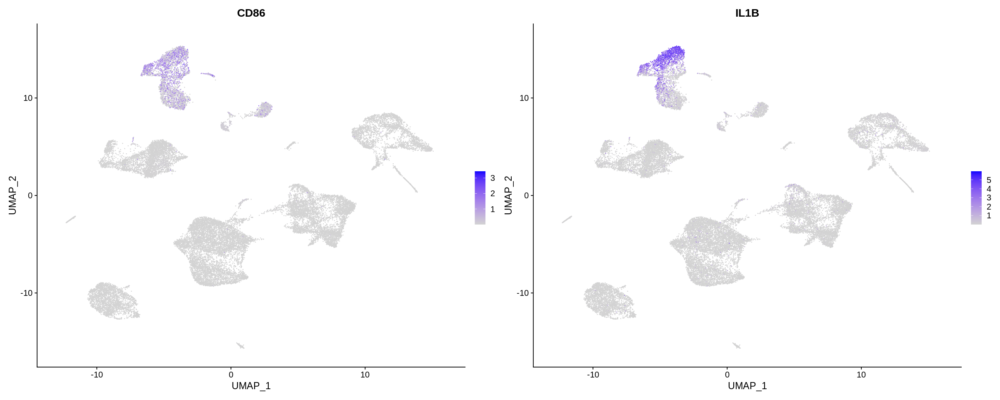

In [24]:
FeaturePlot(DFU_data.integrated, features = c('CD86', 'IL1B'), min.cutoff = "q9")

Warning message:
“Could not find MS4A1 in the default search locations, found in RNA assay instead”


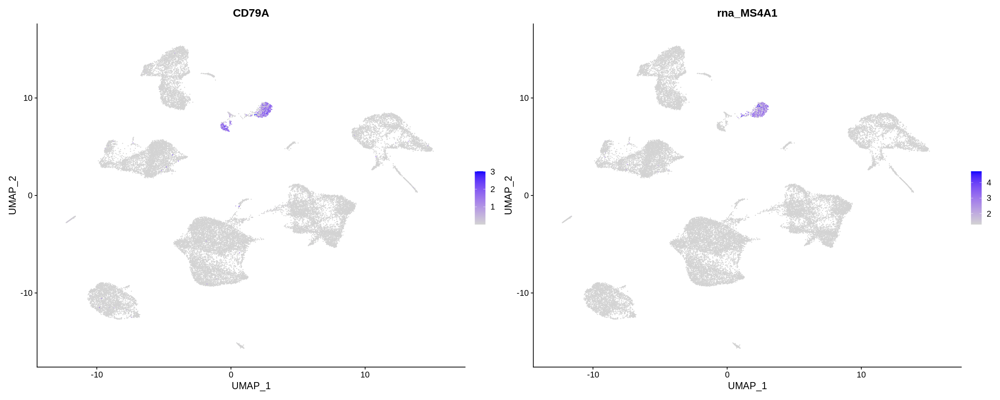

In [25]:
FeaturePlot(DFU_data.integrated, features = c('CD79A', 'MS4A1'), min.cutoff = "q9") #b cell 2

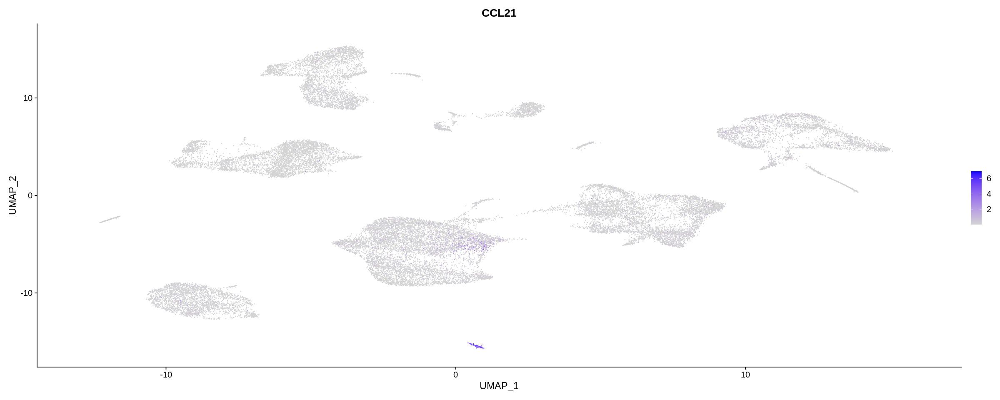

In [26]:
FeaturePlot(DFU_data.integrated, features = c('CCL21'),min.cutoff = "q9") #LymphEndo 8

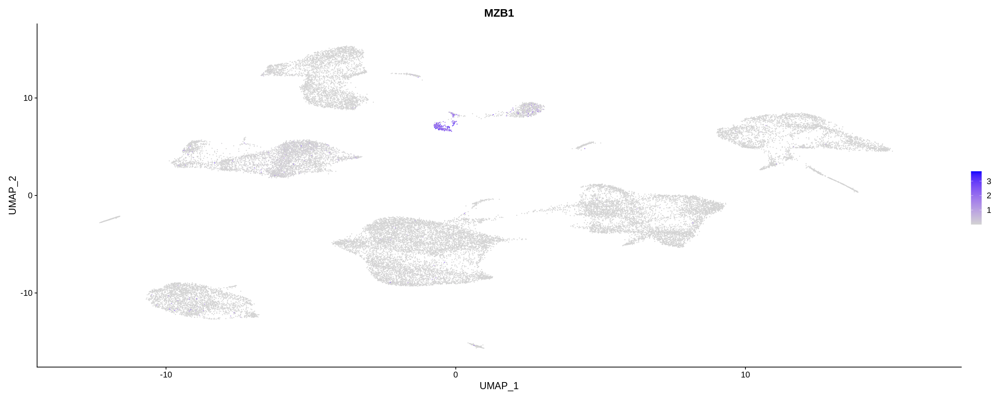

In [28]:
FeaturePlot(DFU_data.integrated, features = c('MZB1'),min.cutoff = "q9") 

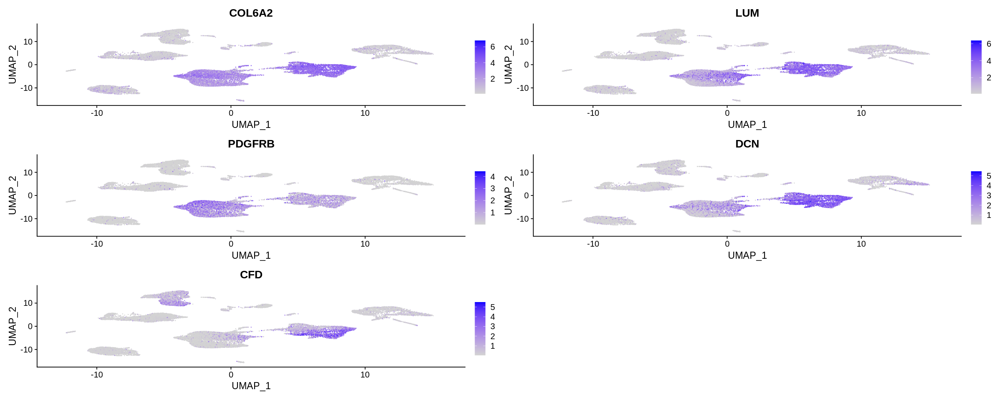

In [29]:
FeaturePlot(DFU_data.integrated, features = c('COL6A2', 'LUM','PDGFRB','DCN','CFD'), min.cutoff = "q9") #Fibroblast 1

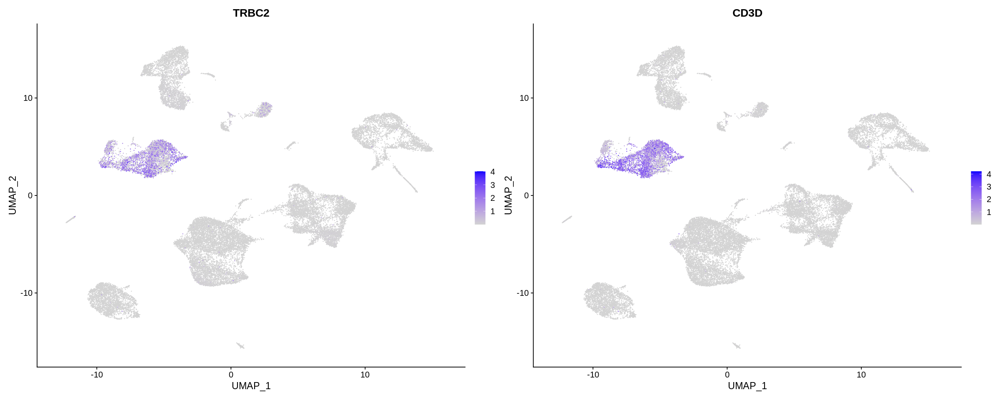

In [30]:
FeaturePlot(DFU_data.integrated, features = c('TRBC2', 'CD3D'), min.cutoff = "q9") #Tcell 2

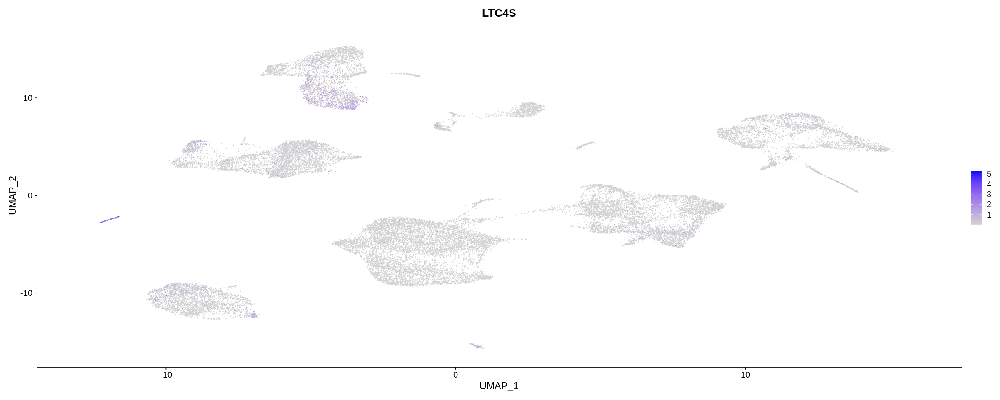

In [31]:
FeaturePlot(DFU_data.integrated, features = c('LTC4S'), min.cutoff = "q9") #Mast cell 7

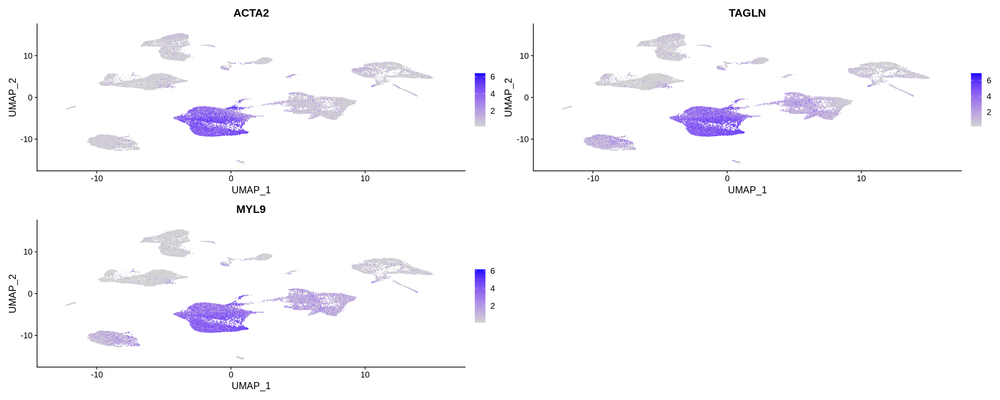

In [32]:
FeaturePlot(DFU_data.integrated, features = c('ACTA2','TAGLN','MYL9'), min.cutoff = "q9") #SMC 0

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: IVT”


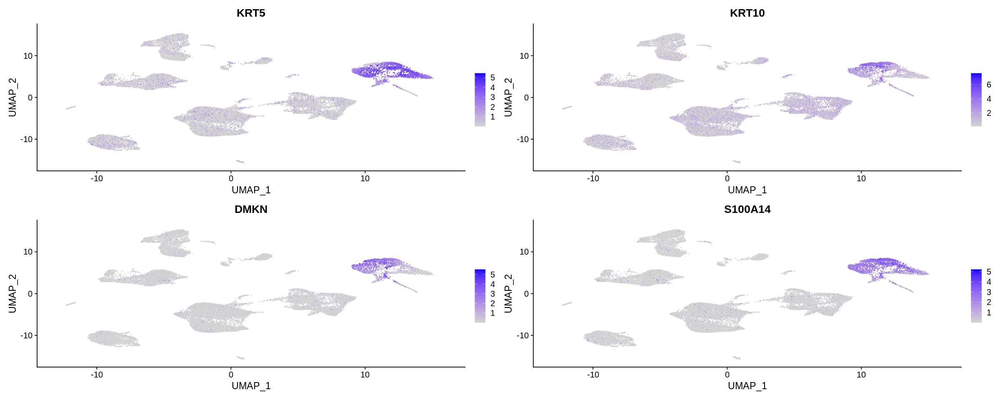

In [33]:
FeaturePlot(DFU_data.integrated, features = c('KRT5', 'KRT10','IVT','DMKN','S100A14'), min.cutoff = "q9") #Keratinocyte 4

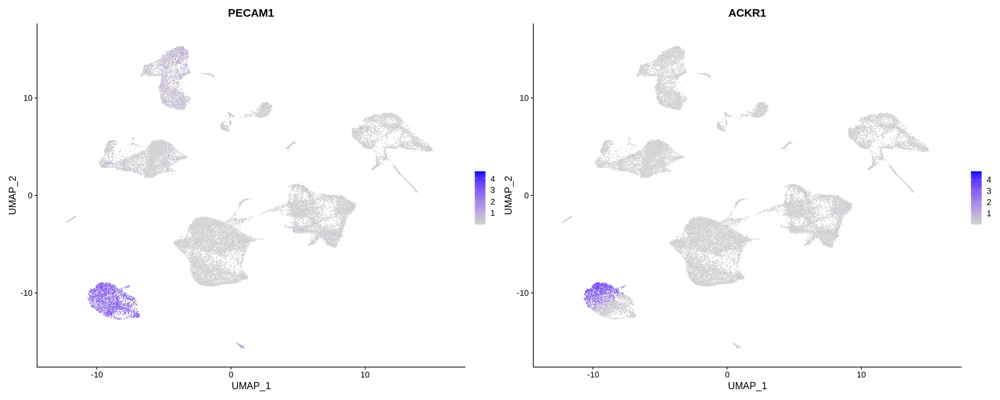

In [34]:
FeaturePlot(DFU_data.integrated, features = c('PECAM1', 'ACKR1'), min.cutoff = "q9")#epithelial 5

Warning message:
“Could not find MITF in the default search locations, found in RNA assay instead”
Warning message:
“Could not find RAB38 in the default search locations, found in RNA assay instead”


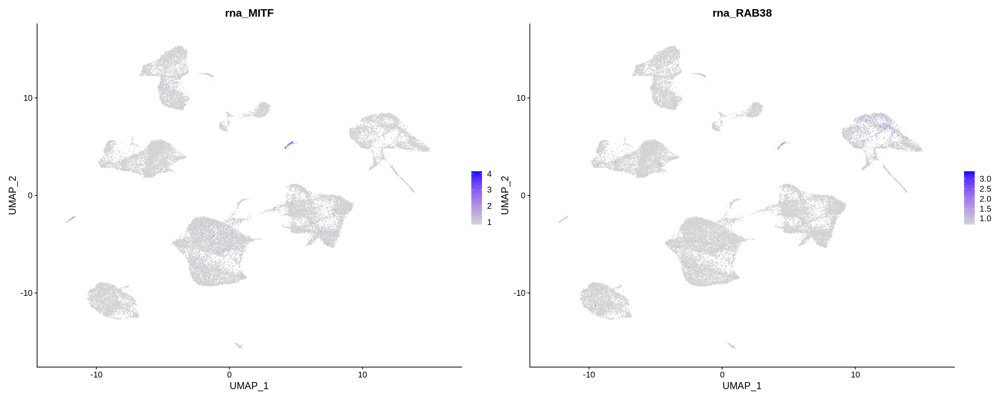

In [35]:
FeaturePlot(DFU_data.integrated, features = c('MITF','RAB38'), min.cutoff = "q9") #Melanocytes 6

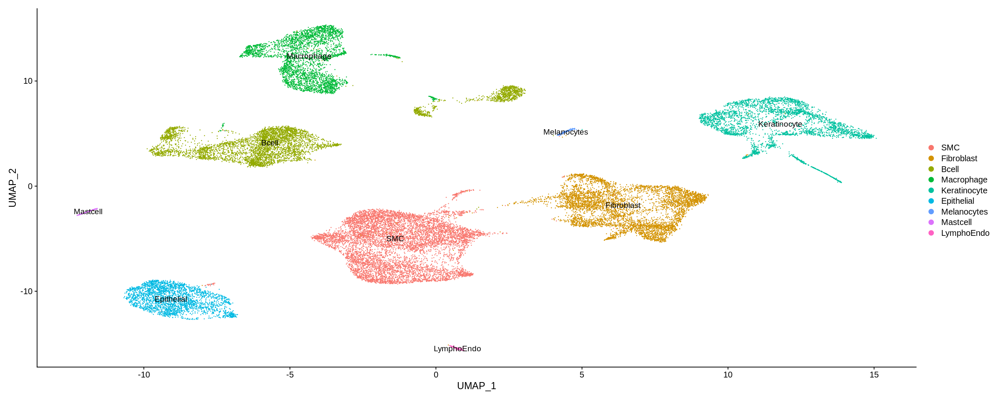

In [37]:
DFU_data.integrated_celltype <- RenameIdents(DFU_data.integrated, 
  `0` = "SMC", `1` = "Fibroblast", `2` = "Bcell",
  `3` = "Macrophage", `4` = "Keratinocyte",
  `5` = "Epithelial", `6` = "Melanocytes", `7` = "Mastcell", 
  `8` = "LymphoEndo")

DimPlot(DFU_data.integrated_celltype, label = TRUE)

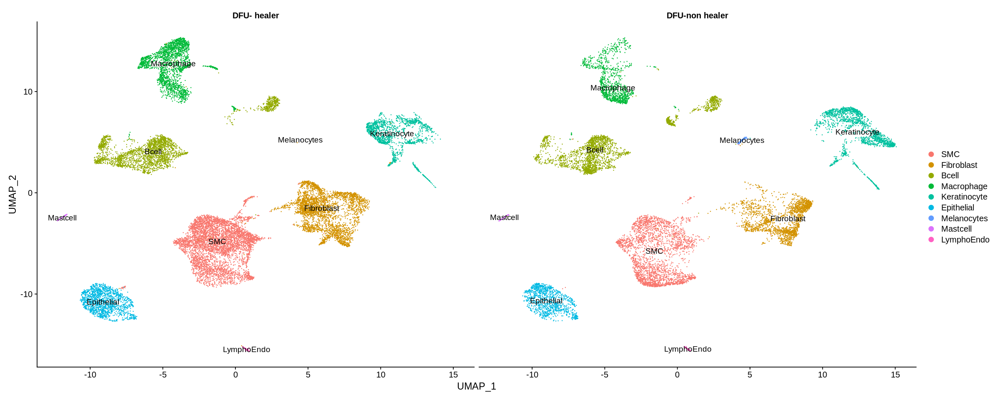

In [38]:
DimPlot(DFU_data.integrated_celltype, 
               split.by = "major_group", 
        label = TRUE) # Add labels to clusters

In [39]:
cluster_counts <- table(DFU_data.integrated_celltype$seurat_clusters)


In [40]:
print(cluster_counts)


   0    1    2    3    4    5    6    7    8 
8125 5538 5247 3540 3510 2746  216  210  187 


In [41]:
head(DFU_data.integrated_celltype)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,major_group,integrated_snn_res.0.02,seurat_clusters
,<chr>,<dbl>,<int>,<dbl>,<chr>,<fct>,<fct>
AAACCTGAGGCAGGTT_1,GSM5050523_DFU- healer,2224,1016,4.181655,DFU- healer,0,0
AAACCTGAGGGAACGG_1,GSM5050523_DFU- healer,3218,1460,5.189559,DFU- healer,5,5
AAACCTGAGGTGATTA_1,GSM5050523_DFU- healer,1785,966,4.537815,DFU- healer,1,1
AAACCTGAGTTAACGA_1,GSM5050523_DFU- healer,2545,1367,3.536346,DFU- healer,0,0
AAACCTGCATGTTGAC_1,GSM5050523_DFU- healer,2019,972,4.061417,DFU- healer,1,1
AAACCTGGTGACTCAT_1,GSM5050523_DFU- healer,3253,1342,2.981863,DFU- healer,0,0
AAACCTGGTTCAGTAC_1,GSM5050523_DFU- healer,3456,1080,3.559028,DFU- healer,3,3
AAACCTGTCCGCATAA_1,GSM5050523_DFU- healer,6744,2205,3.825623,DFU- healer,1,1
AAACCTGTCGGAAACG_1,GSM5050523_DFU- healer,3763,1510,2.870050,DFU- healer,1,1


In [42]:
# Assuming your group information is stored in a column named "group"
# Replace "group" with the actual column name containing group information

group_counts <- table(DFU_data.integrated_celltype$major_group)

# Display group cell counts
print(group_counts)



   DFU- healer DFU-non healer 
         17376          11943 


In [43]:
# Assuming your Seurat object is named "seurat_obj" and contains your integrated data

# Count cells in each cluster for both groups
cluster_counts <- table(DFU_data.integrated_celltype$seurat_clusters, DFU_data.integrated_celltype$major_group)

# Display the counts and percentages
print(cluster_counts)




   
    DFU- healer DFU-non healer
  0        5288           2837
  1        3550           1988
  2        2778           2469
  3        2402           1138
  4        1624           1886
  5        1562           1184
  6           1            215
  7          85            125
  8          86            101


In [44]:
# Assuming your Seurat object is named "seurat_obj" and contains your integrated data

# Count cells in each cluster for both groups
cluster_counts <- table(DFU_data.integrated_celltype$seurat_clusters, DFU_data.integrated_celltype$orig.ident)

# Display the counts and percentages
print(cluster_counts)


   
    GSM5050523_DFU- healer GSM5050527_DFU- healer GSM5050530_DFU-non healer
  0                   1407                    798                       380
  1                    723                    456                        73
  2                    290                     94                       894
  3                     96                    406                        51
  4                     51                     42                       103
  5                    300                     96                       235
  6                      0                      0                         1
  7                     29                     10                        30
  8                     15                      2                        10
   
    GSM5050531_DFU- healer GSM5050532_DFU- healer GSM5050533_DFU-non healer
  0                    203                    249                       761
  1                    209                    659                       818
  2 

In [53]:
install.packages("writexl")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [54]:
library("writexl")


In [ ]:
# Assuming cluster_counts is a table or matrix
# Convert it to a data frame
#cluster_counts_df <- as.data.frame(cluster_counts)


# Specify the file path
#file_path <- "/data2/ZenNa/DFU_Project/Result/cellcount.xlsx"

# Write the data frame to an Excel file
#write_xlsx(cluster_counts_df, path = file_path)


In [ ]:
# Calculate percentages
#percentage <- prop.table(cluster_counts, margin = 2) * 100

# Display percentages
#print(percentage)

In [46]:
# Define your filter conditions
logFCfilter <- 1.0  # You can change this value to your desired threshold
adjPvalfilter <- 0.05  # You can change this value to your desired threshold

# Subset the data frame using the filter conditions
subset_markers <- cluster.markers[
  (abs(as.numeric(as.vector(cluster.markers$avg_log2FC))) > logFCfilter) &
  (as.numeric(as.vector(cluster.markers$p_val_adj)) < adjPvalfilter), ]

# Now you can work with the 'subset_markers' data frame


In [47]:
sig.markers <- cluster.markers[(abs(as.numeric(as.vector(cluster.markers$avg_log2FC))))>logFCfilter & as.numeric((as.vector(cluster.markers$p_val_adj))<adjPvalfilter),]

In [70]:
install.packages("openxlsx")
install.packages("dplyr")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [71]:
library(openxlsx)
library(dplyr)

In [61]:
write.xls(sig.markers,file="cluster.markers.xls",sep="",row.names = F,quote = F)

ERROR: Error in write.xls(sig.markers, file = "cluster.markers.xls", sep = "", : could not find function "write.xls"


In [65]:
# Replace 'sig.markers' with your data frame
sig.markers <- cluster.markers[(abs(as.numeric(as.vector(cluster.markers$avg_log2FC))))>logFCfilter & as.numeric((as.vector(cluster.markers$p_val_adj))<adjPvalfilter),]

In [66]:
# Specify the file path for the Excel file
excel_file <- "cluster.markers.xlsx"

In [67]:
# Write the data frame to the Excel file
write.xlsx(sig.markers, file = excel_file, rowNames = FALSE)

In [84]:
top10 <- cluster.markers %>%
  group_by(cluster) %>%
  top_n(n = 10, wt = avg_log2FC)

In [83]:
pdf(file="cluster.markers.pdf",width=48,height=36)

In [77]:
cca.merged.obj <- IntegrateData(anchorset = anchors, dims = 1:50)

Building integrated reference

Merging dataset 2 into 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data


Integrating dataset 3 with reference dataset

Finding integration vectors

Finding integration vector weights

Integrating data


Integrating dataset 4 with reference dataset

Finding integration vectors

Finding integration vector weights

Integrating data


Integrating dataset 5 with reference dataset

Finding integration vectors

Finding integration vector weights

Integrating data


Integrating dataset 6 with reference dataset

Finding integration vectors

Finding integration vector weights

Integrating data


Integrating dataset 7 with reference dataset

Finding integration vectors

Finding integration vector weights

Integrating data


Integrating dataset 8 with reference dataset

Finding integration vectors

Finding integration vector weights

Integrating data


Integrating dataset 9 with reference dat

In [92]:
cca.merged.obj$sample <- as.vector(sapply(cca.merged.obj$orig.ident, function(x){strsplit(x, "_")[[1]][2]}))

In [93]:
DefaultAssay(cca.merged.obj) <- "integrated" 

In [94]:
cca.merged.obj <- ScaleData(cca.merged.obj, verbose = FALSE)
cca.merged.obj <- RunPCA(cca.merged.obj, verbose = FALSE)

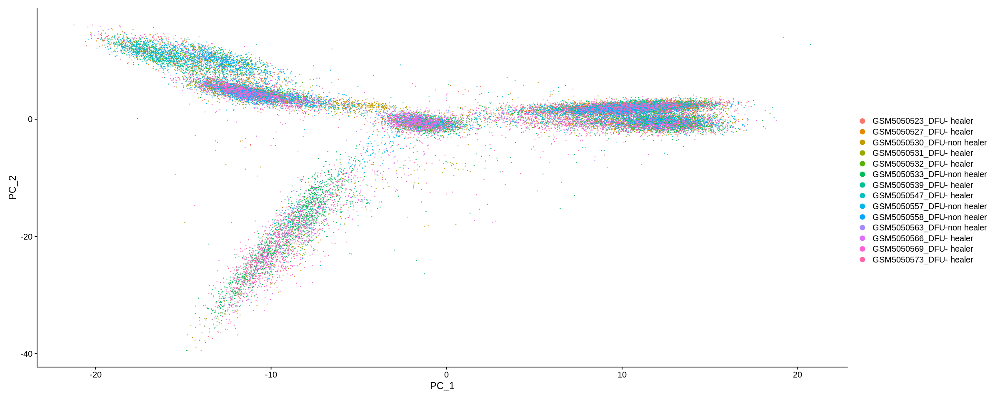

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 29319
Number of edges: 998055

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9137
Number of communities: 21
Elapsed time: 5 seconds


21:09:47 UMAP embedding parameters a = 0.9922 b = 1.112

21:09:47 Read 29319 rows and found 15 numeric columns

21:09:47 Using Annoy for neighbor search, n_neighbors = 30

21:09:47 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

21:09:50 Writing NN index file to temp file /tmp/RtmpMnH2Sm/file8bb24ce595ba

21:09:50 Searching Annoy index using 1 thread, search_k = 3000

21:09:59 Annoy recall = 100%

21:09:59 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

21:10:00 Initializing from normalized Laplacian + noise (using irlba)

21:10:41 Commencing optimization for 200 epochs, with 1215046 positive edges

21:10:52 Optimization finished



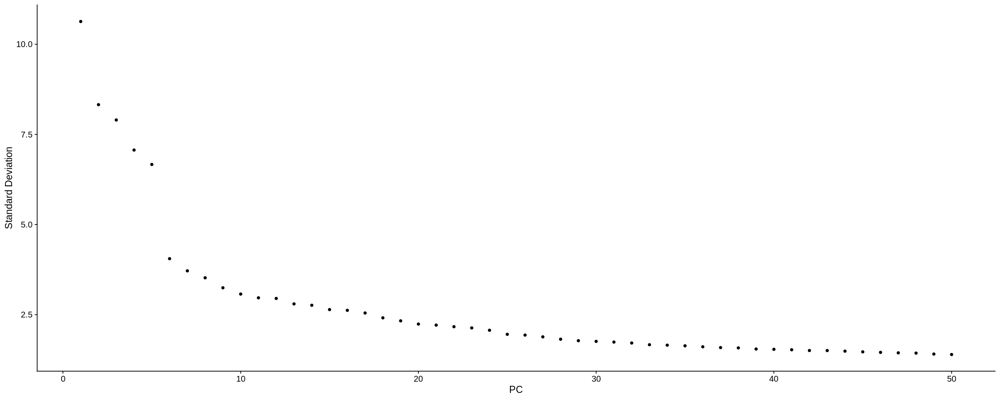

In [95]:
DimPlot(cca.merged.obj, reduction = "pca")
ElbowPlot(cca.merged.obj, ndims=50)

cca.merged.obj <- FindNeighbors(cca.merged.obj, reduction = "pca", dims = 1:15)
cca.merged.obj <- FindClusters(cca.merged.obj, resolution = 0.8)
cca.merged.obj <- RunUMAP(cca.merged.obj, reduction = "pca", dims = 1:15)
cca.merged.obj <- RunTSNE(cca.merged.obj, reduction = "pca", dims = 1:15)

In [96]:
p1 <- DimPlot(cca.merged.obj, reduction = "umap", label=T) + NoLegend()
p2 <- DimPlot(cca.merged.obj, reduction = "tsne", label=T) + NoLegend()

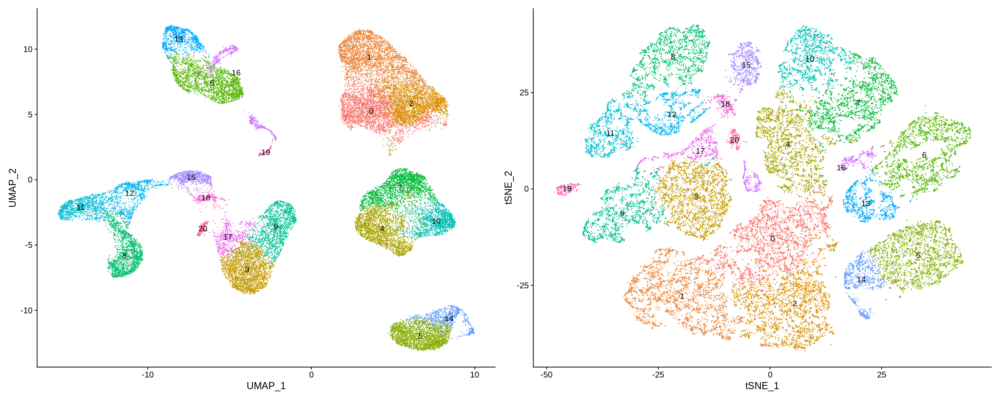

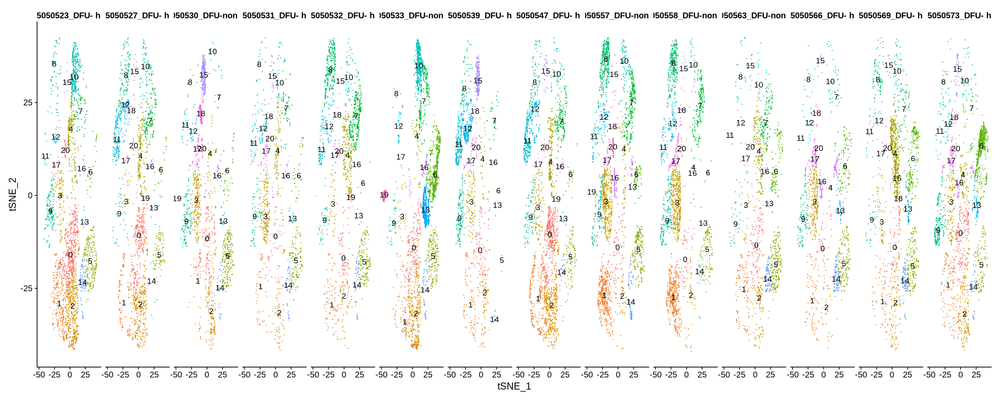

In [97]:
p1+p2
p3 <- DimPlot(cca.merged.obj, reduction = "tsne", label=T,  split.by = "orig.ident") + NoLegend()
p3

In [98]:
cluster.markers <- FindAllMarkers(obj=cca.merged.obj,
                                only.pos=FALSE,
                                min.pct=0.25,
                                logfc.thrshold=logFCfilter)
sig.markers <- cluster.markers[(abs(as.numeric(as.vector(cluster.markers$avg_log2FC))))>logFCfilter & as.numeric((as.vector(cluster.markers$p_val_adj))<adjPvalfilter),]

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20



In [99]:
top10 <- cluster.markers %>% group_by(cluster) %>% top_n(n=10,wt=avg_log2FC)

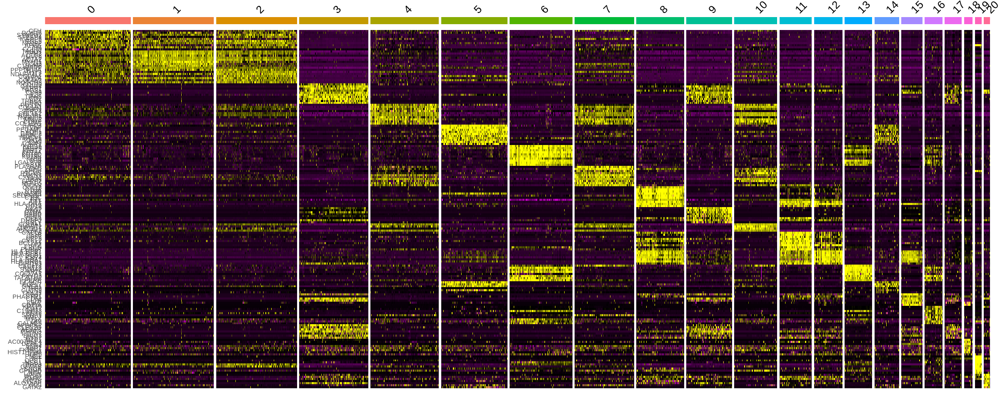

In [100]:
# Check if the object cca.merged.obj exists
if (exists("cca.merged.obj")) {
  # If it exists, you can proceed with the DoHeatmap function
  DoHeatmap(obj = cca.merged.obj, features = top10$gene) + NoLegend()
} else {
  # If it doesn't exist, you may need to load or create it
  print("cca.merged.obj does not exist in the current environment.")
}

In [101]:
head(cca.merged.obj)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,sample,integrated_snn_res.0.8,seurat_clusters
,<chr>,<dbl>,<int>,<dbl>,<chr>,<fct>,<fct>
AAACCTGAGGCAGGTT_1,GSM5050523_DFU- healer,2224,1016,4.181655,DFU- healer,2,2
AAACCTGAGGGAACGG_1,GSM5050523_DFU- healer,3218,1460,5.189559,DFU- healer,5,5
AAACCTGAGGTGATTA_1,GSM5050523_DFU- healer,1785,966,4.537815,DFU- healer,10,10
AAACCTGAGTTAACGA_1,GSM5050523_DFU- healer,2545,1367,3.536346,DFU- healer,2,2
AAACCTGCATGTTGAC_1,GSM5050523_DFU- healer,2019,972,4.061417,DFU- healer,10,10
AAACCTGGTGACTCAT_1,GSM5050523_DFU- healer,3253,1342,2.981863,DFU- healer,2,2
AAACCTGGTTCAGTAC_1,GSM5050523_DFU- healer,3456,1080,3.559028,DFU- healer,8,8
AAACCTGTCCGCATAA_1,GSM5050523_DFU- healer,6744,2205,3.825623,DFU- healer,10,10
AAACCTGTCGGAAACG_1,GSM5050523_DFU- healer,3763,1510,2.870050,DFU- healer,10,10


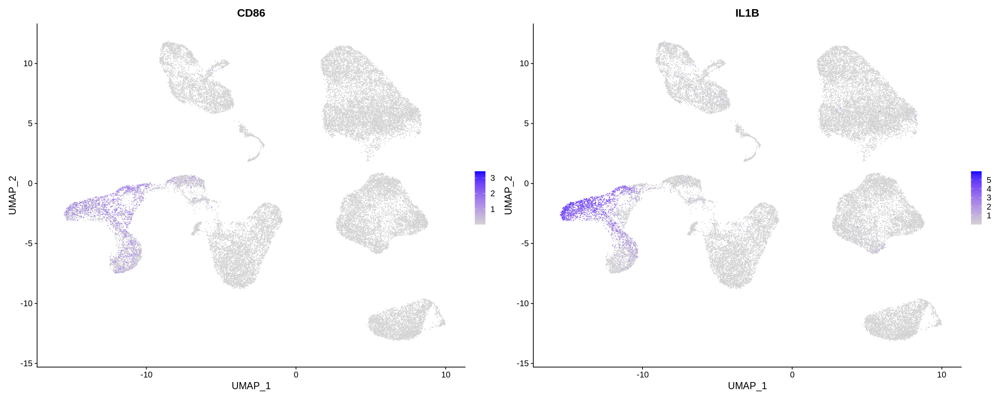

In [102]:
FeaturePlot(cca.merged.obj, features = c('CD86', 'IL1B'), min.cutoff = "q9")

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: CD206”


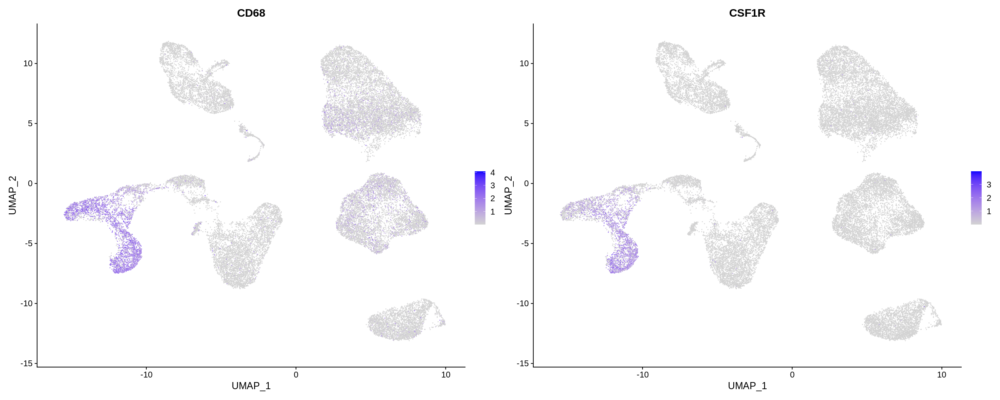

In [104]:
FeaturePlot(cca.merged.obj, features = c('CD68', 'CSF1R', 'CD206'), min.cutoff = "q9")